In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


In [2]:
# Load the data into a Pandas DataFrame
data = pd.read_csv("wine_complete.csv")
data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


In [3]:
# # Split the data into features (X) and target variable (y)
# X = data.drop(columns=["color"])
# y = data["color"]
# Separate features (X) and target (y)
X = data.drop(columns=['color'])  # Drop the 'color' column
y = data['color']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=45)

In [4]:
# Initialize the RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the classifier
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [5]:
# Predict the color for the test data
y_pred = rf_classifier.predict(X_test)

# Calculate accuracy score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)



Accuracy: 0.9938461538461538


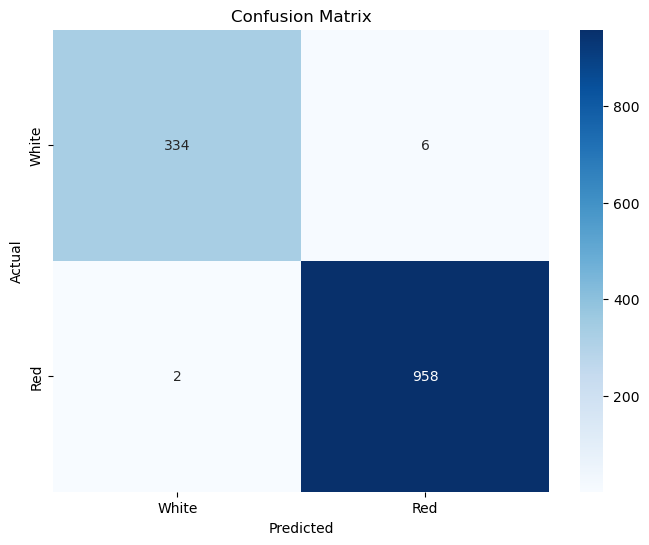

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['White', 'Red'], yticklabels=['White', 'Red'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

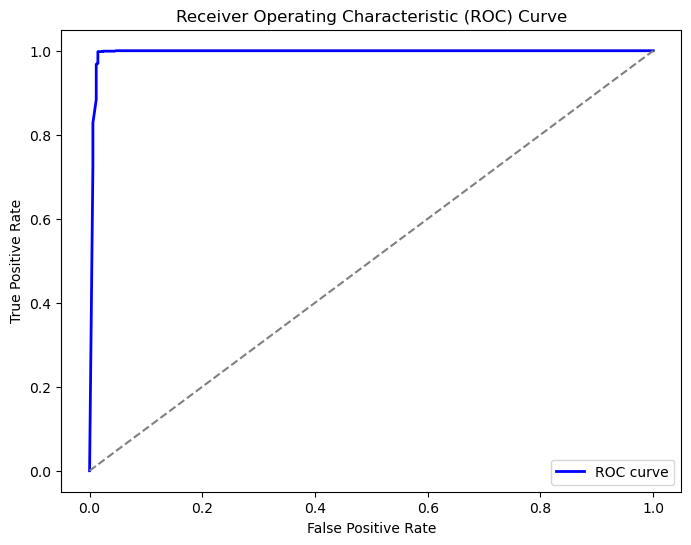

In [7]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, rf_classifier.predict_proba(X_test)[:, 1])

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


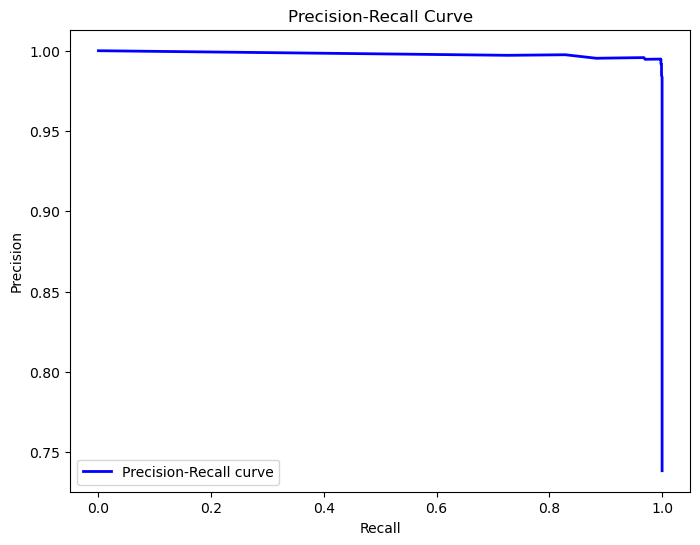

In [8]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, rf_classifier.predict_proba(X_test)[:, 1])

# Plot precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()

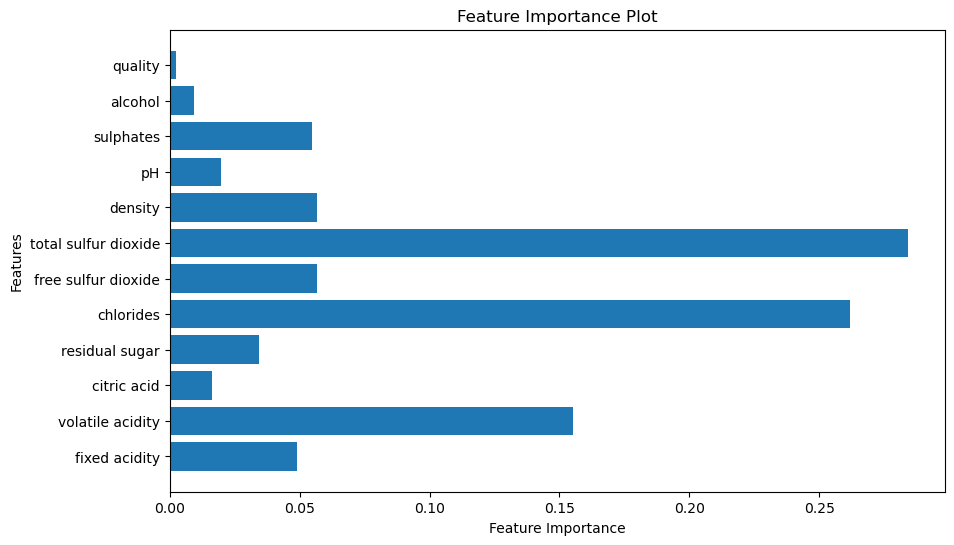

In [9]:
# Get feature importances from the trained model
feature_importances = rf_classifier.feature_importances_

# Create a bar plot for feature importances
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importances)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Plot')
plt.show()

## tensorflow

In [10]:
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [11]:
# Load the data into a Pandas DataFrame
datatf = pd.read_csv("wine_complete.csv")
datatf

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,1
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,1
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,1


In [12]:
# Separate features (X) and target (y)
X = datatf.drop(columns=['color'])
y = datatf['color']

In [13]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [14]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [15]:
# Convert target labels to one-hot encoding
y_train_encoded = tf.keras.utils.to_categorical(y_train)
y_test_encoded = tf.keras.utils.to_categorical(y_test)

In [16]:
# Initialize the model
modeltf = tf.keras.Sequential()

# Add input layer
modeltf.add(tf.keras.layers.Dense(units=64, activation='relu', input_shape=(X_train_scaled.shape[1],)))

# Add hidden layers
modeltf.add(tf.keras.layers.Dense(units=128, activation='relu'))

# Add output layer
modeltf.add(tf.keras.layers.Dense(units=2, activation='sigmoid'))  # 2 classes: white and red

In [17]:
# Compile the model
modeltf.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [18]:
# Train the model
history = modeltf.fit(X_train_scaled, y_train_encoded, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
130/130 [==============================] - 0s 1ms/step - loss: 0.1279 - accuracy: 0.9656 - val_loss: 0.0286 - val_accuracy: 0.9952
Epoch 2/50
130/130 [==============================] - 0s 665us/step - loss: 0.0251 - accuracy: 0.9952 - val_loss: 0.0263 - val_accuracy: 0.9952
Epoch 3/50
130/130 [==============================] - 0s 626us/step - loss: 0.0202 - accuracy: 0.9959 - val_loss: 0.0290 - val_accuracy: 0.9952
Epoch 4/50
130/130 [==============================] - 0s 621us/step - loss: 0.0176 - accuracy: 0.9966 - val_loss: 0.0233 - val_accuracy: 0.9971
Epoch 5/50
130/130 [==============================] - 0s 618us/step - loss: 0.0166 - accuracy: 0.9966 - val_loss: 0.0266 - val_accuracy: 0.9952
Epoch 6/50
130/130 [==============================] - 0s 580us/step - loss: 0.0149 - accuracy: 0.9971 - val_loss: 0.0254 - val_accuracy: 0.9971
Epoch 7/50
130/130 [==============================] - 0s 598us/step - loss: 0.0129 - accuracy: 0.9971 - val_loss: 0.0258 - val_accuracy: 0

In [19]:
# Evaluate the model using the test data
model_loss, model_accuracy = modeltf.evaluate(X_test_scaled, y_test_encoded, verbose=2)
print(f"Loss: {model_loss}, Accuracy: {model_accuracy}")

41/41 - 0s - loss: 0.0981 - accuracy: 0.9954 - 33ms/epoch - 806us/step
Loss: 0.09809540212154388, Accuracy: 0.9953846335411072


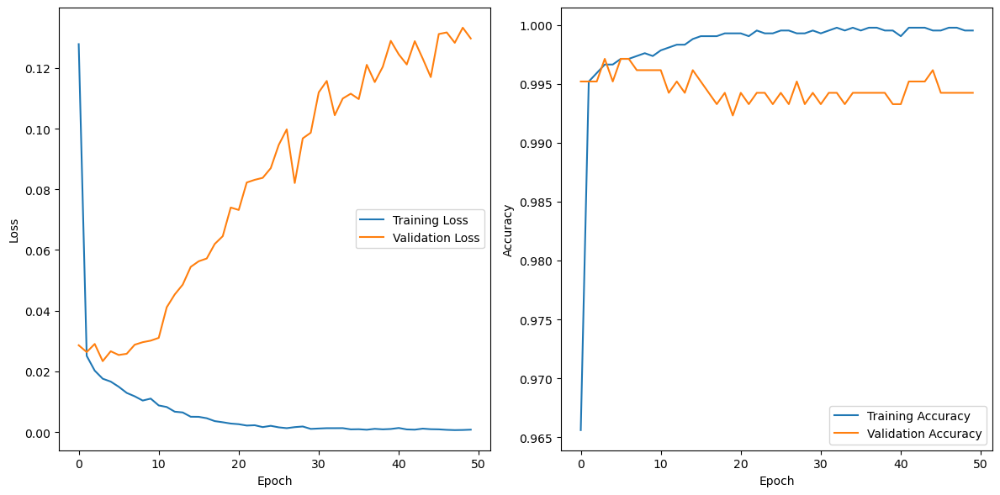

In [20]:
import matplotlib.pyplot as plt
# Plot training history
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

41/41 [==============================] - 0s 337us/step


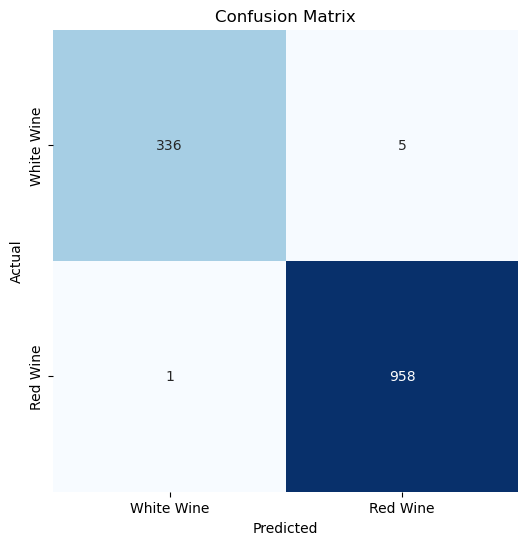

In [21]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict on test data
y_pred = modeltf.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert one-hot encoded labels back to original labels
y_test_original = np.argmax(y_test_encoded, axis=1)

# Create confusion matrix
conf_matrix = confusion_matrix(y_test_original, y_pred_classes)

# Plot confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=['White Wine', 'Red Wine'],
            yticklabels=['White Wine', 'Red Wine'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


## logistic regression

In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [23]:
# Load the data
datalr = pd.read_csv("wine_complete.csv")


In [24]:
# Separate features (X) and target variable (y)
X = datalr.drop(['color'], axis=1)
y = datalr['color']

In [25]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [26]:
# Initialize and train the logistic regression model
modellr = LogisticRegression(max_iter=1000)
modellr.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [27]:
from sklearn.linear_model import LogisticRegression

In [28]:
# Make predictions on the testing data
y_pred = modellr.predict(X_test)

In [29]:
# Evaluate the model
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.98      0.94      0.96       341
           1       0.98      0.99      0.99       959

    accuracy                           0.98      1300
   macro avg       0.98      0.97      0.97      1300
weighted avg       0.98      0.98      0.98      1300



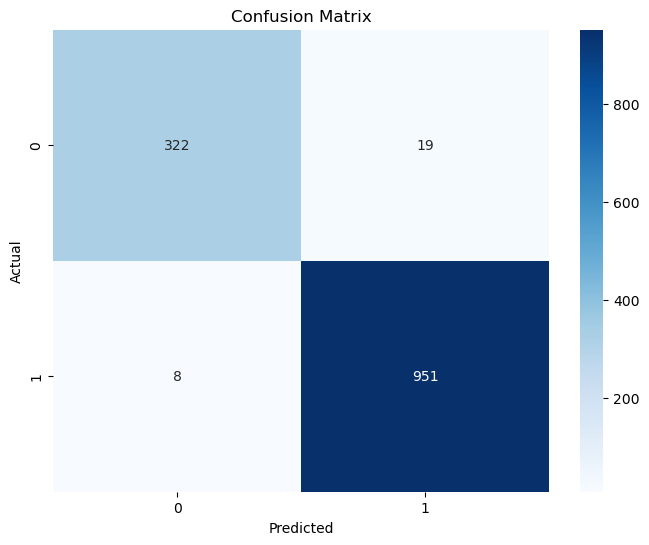

In [30]:
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

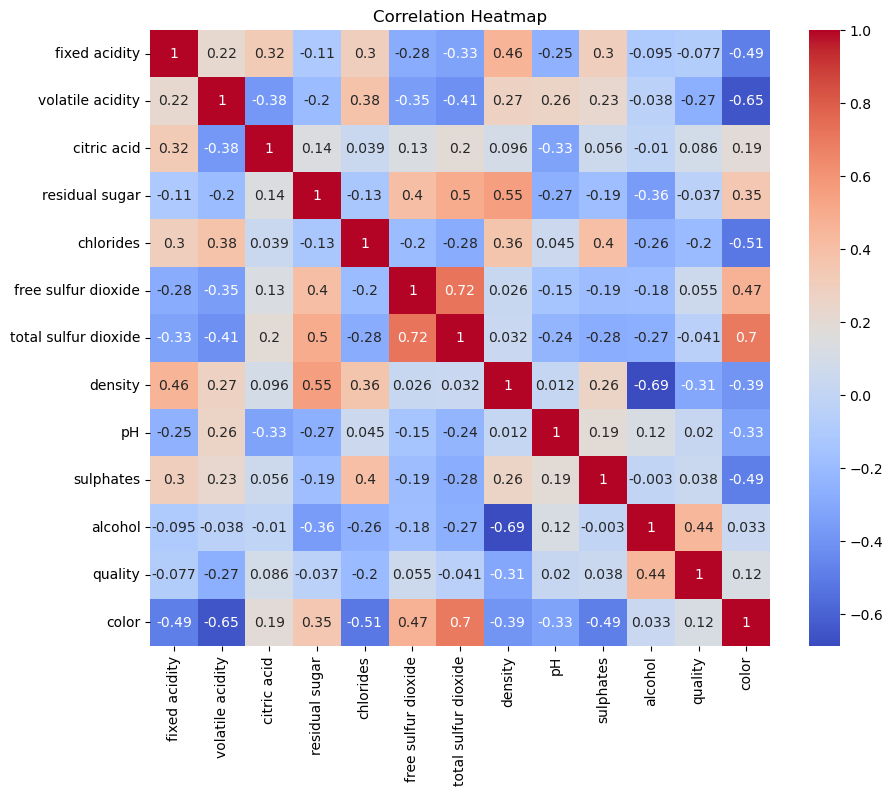

In [31]:
import seaborn as sns

corr_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


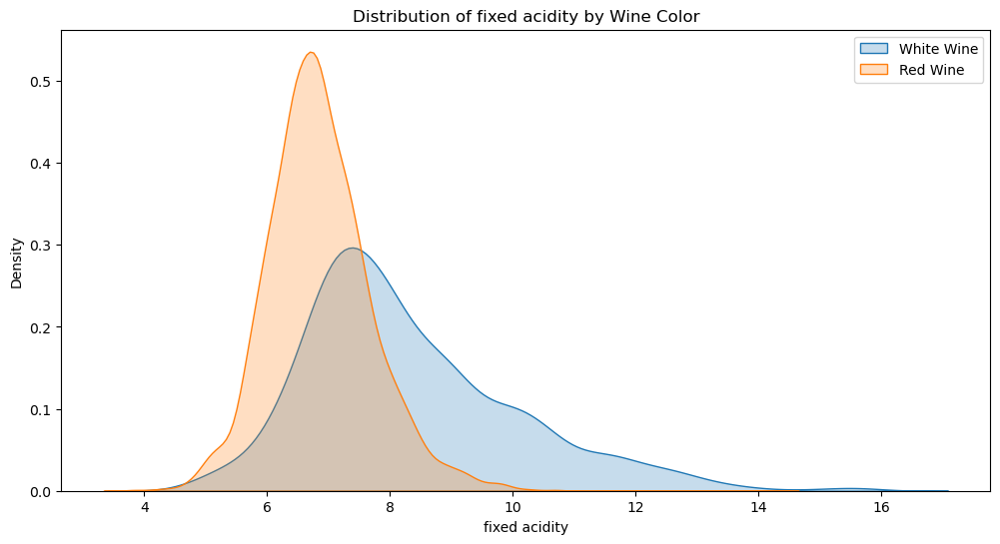

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


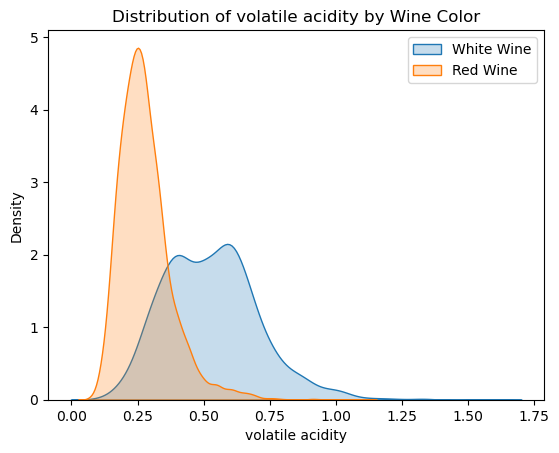

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


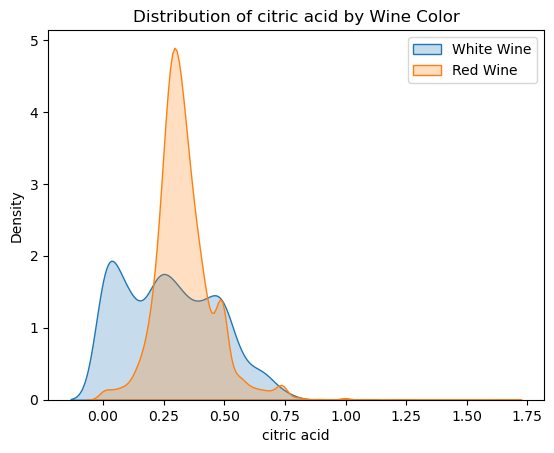

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


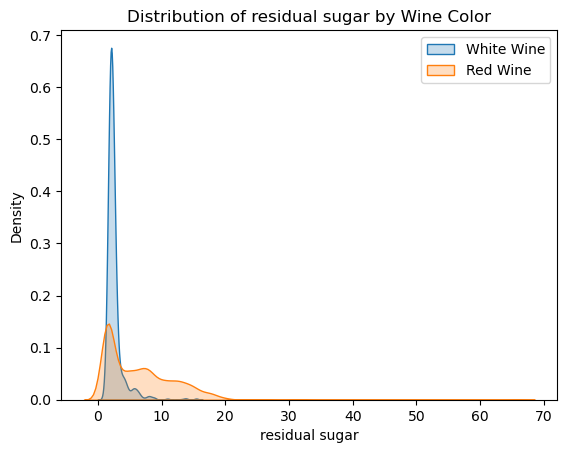

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


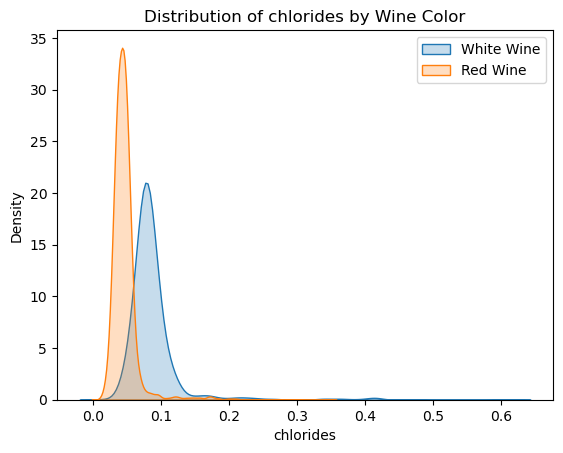

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


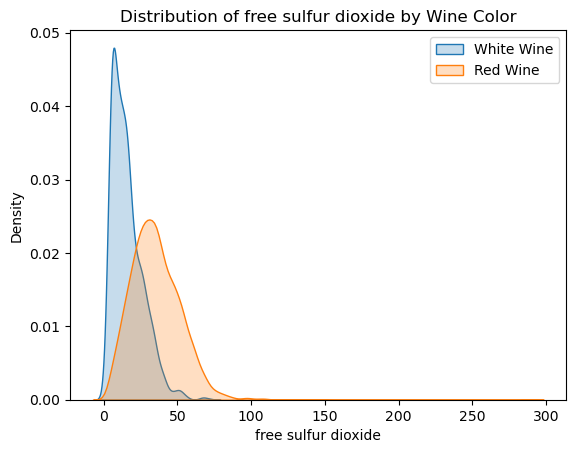

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


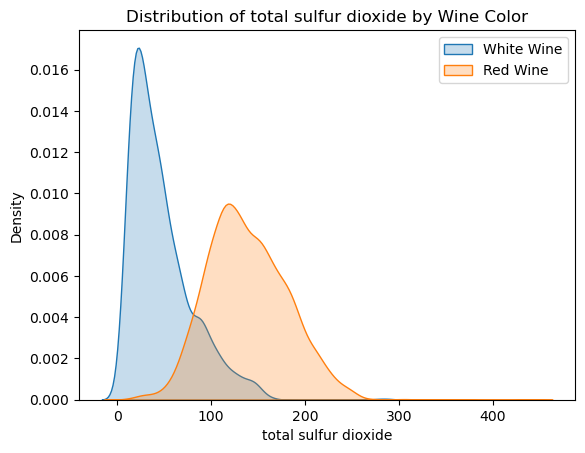

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


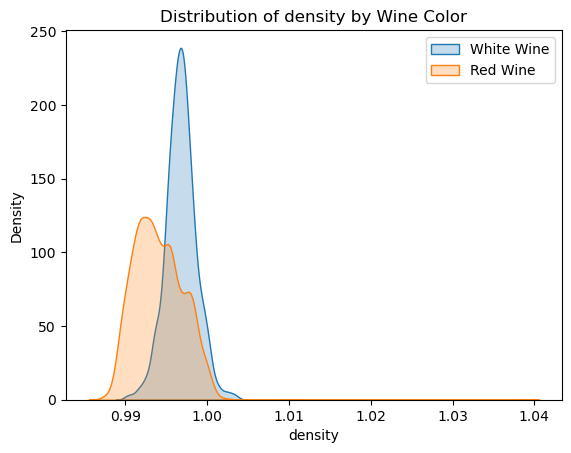

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


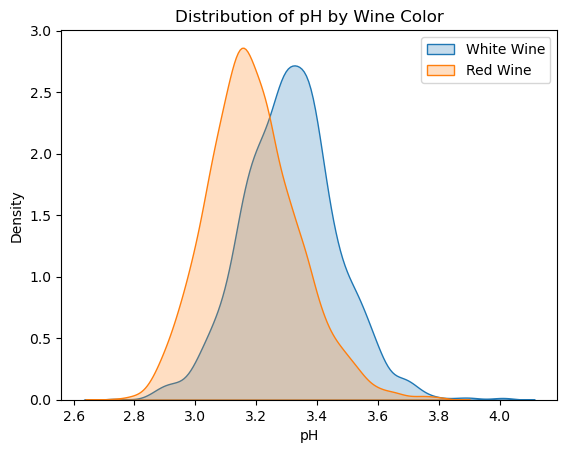

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


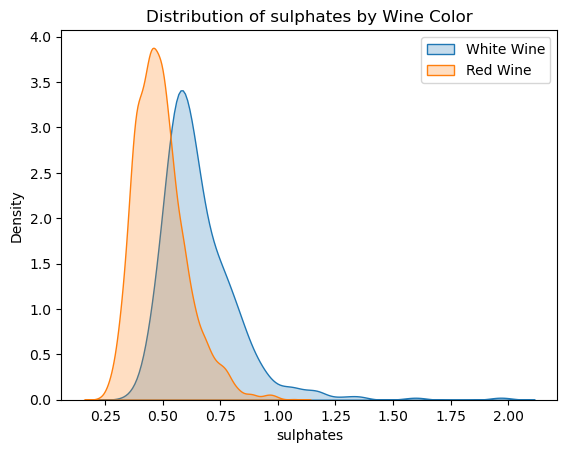

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


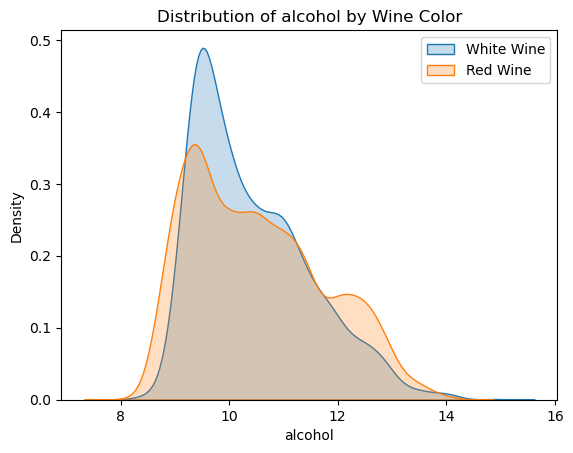

/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
/var/folders/2v/zx5x7cjs05l12bxttql2pwd80000gn/T/ipykernel_51806/492894951.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)


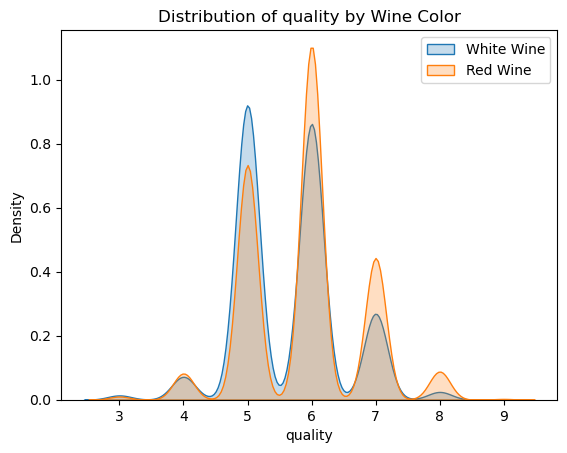

In [32]:
plt.figure(figsize=(12, 6))
for feature in X.columns:
    sns.kdeplot(data[data['color'] == 0][feature], label='White Wine', shade=True)
    sns.kdeplot(data[data['color'] == 1][feature], label='Red Wine', shade=True)
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.title(f"Distribution of {feature} by Wine Color")
    plt.legend()
    plt.show()


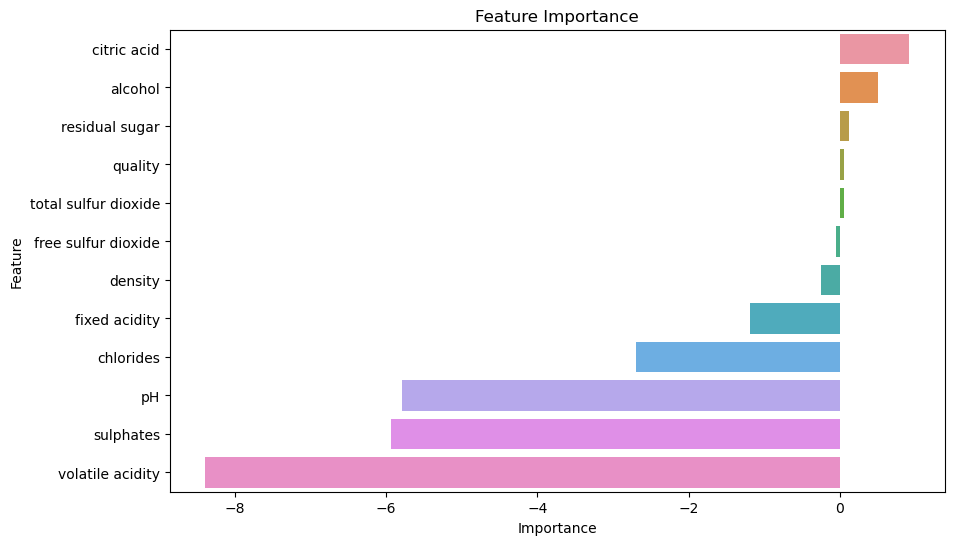

In [34]:
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': modellr.coef_[0]})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importances)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()

## KNN

Accuracy: 0.99


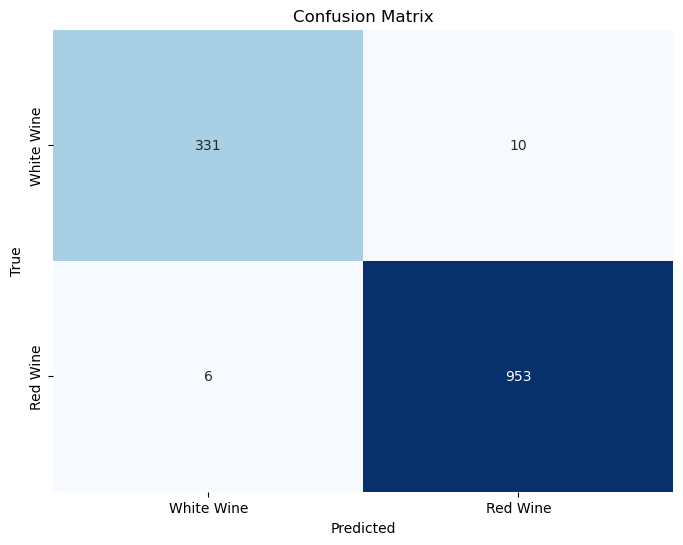

In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data into a Pandas DataFrame
data = pd.read_csv("wine_complete.csv")

# Split the data into features (X) and target (y)
X = data.drop(columns=['color'])
y = data['color']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)

# Train the KNN classifier
knn.fit(X_train_scaled, y_train)

# Predict the color on the test set
y_pred = knn.predict(X_test_scaled)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['White Wine', 'Red Wine'], yticklabels=['White Wine', 'Red Wine'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

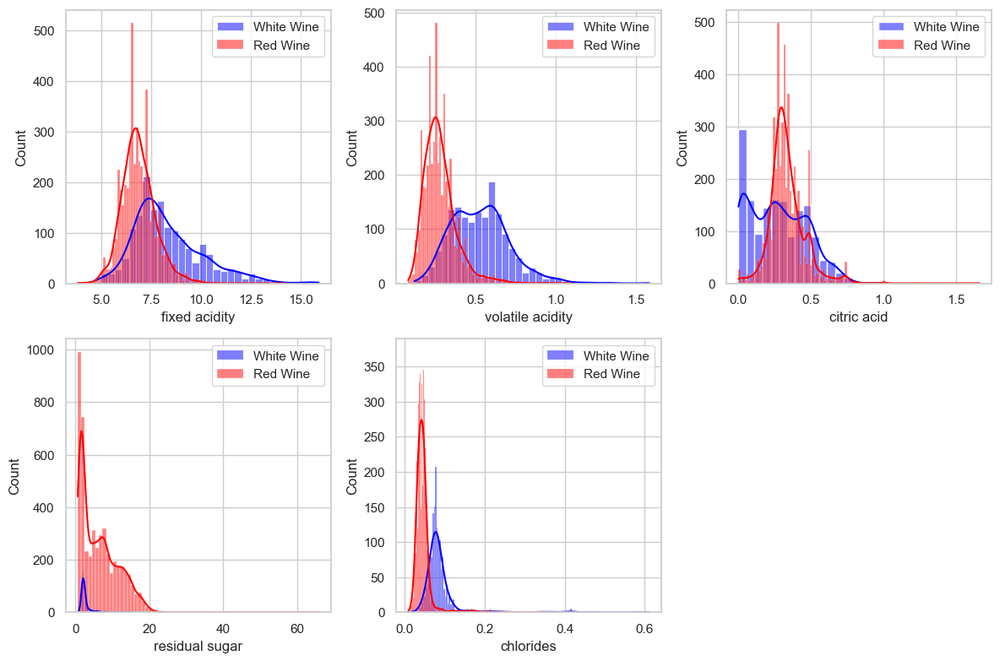

In [36]:
import seaborn as sns

# Plot feature distributions for each wine color
feature_names = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'chlorides']
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

for feature in feature_names:
    plt.subplot(2, 3, feature_names.index(feature) + 1)
    sns.histplot(data[data['color'] == 0][feature], label='White Wine', kde=True, color='blue')
    sns.histplot(data[data['color'] == 1][feature], label='Red Wine', kde=True, color='red')
    plt.legend()
    plt.xlabel(feature)

plt.tight_layout()
plt.show()

/Users/micahgalbadores/anaconda3/envs/pythondataucb/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


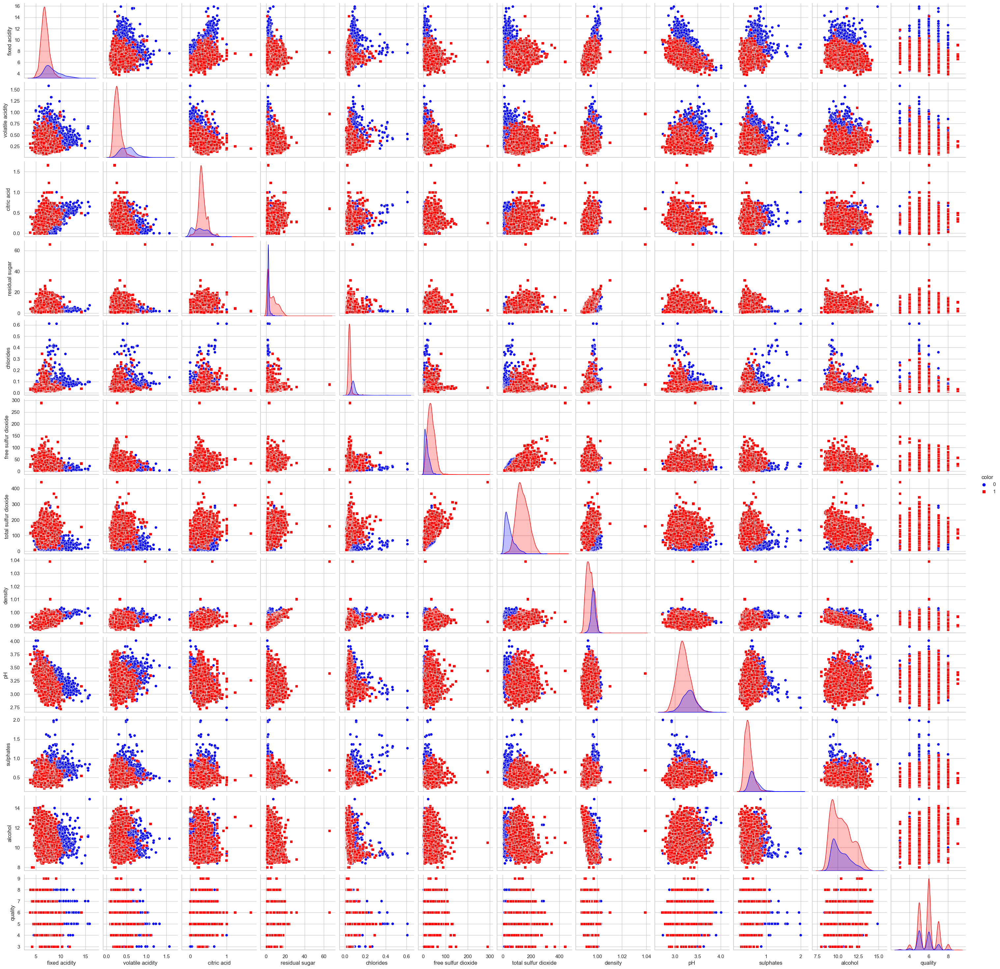

In [37]:
import seaborn as sns

# Create a pairplot
sns.pairplot(data, hue='color', markers=['o', 's'], palette={0: 'blue', 1: 'red'})
plt.show()

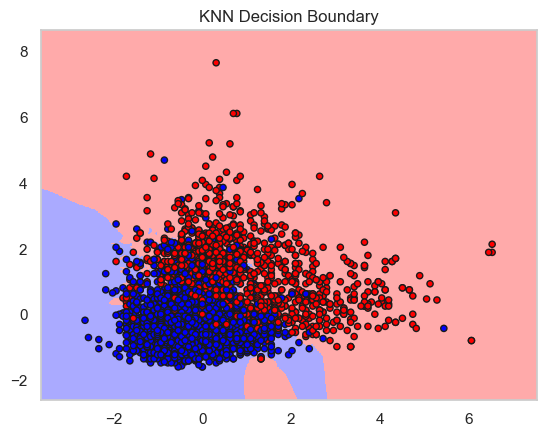

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def plot_decision_boundary(X, y, classifier, title):
    h = .02  # Step size in the mesh
    cmap_light = ListedColormap(['#FFAAAA', '#AAAAFF'])
    cmap_bold = ListedColormap(['#FF0000', '#0000FF'])

    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    Z = classifier.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
                edgecolor='k', s=20)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title(title)

# We'll use only two features for visualization purposes (you can choose any two)
X_subset = X_train_scaled[:, :2]
knn_subset = KNeighborsClassifier(n_neighbors=5)
knn_subset.fit(X_subset, y_train)

plot_decision_boundary(X_subset, y_train, knn_subset, title="KNN Decision Boundary")
plt.show()

## SVC

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

datasvc = pd.read_csv("wine_complete.csv")
datasvc

# Assuming 'data' contains your DataFrame
X = datasvc.drop(['color'], axis=1)  # Features
y = datasvc['color']                  # Target

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create an SVC classifier
clf = SVC()

# Train the classifier
clf.fit(X_train, y_train)

# Predict color labels for the test data
predictions = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

Accuracy: 0.9284615384615384


/Users/micahgalbadores/anaconda3/envs/pythondataucb/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


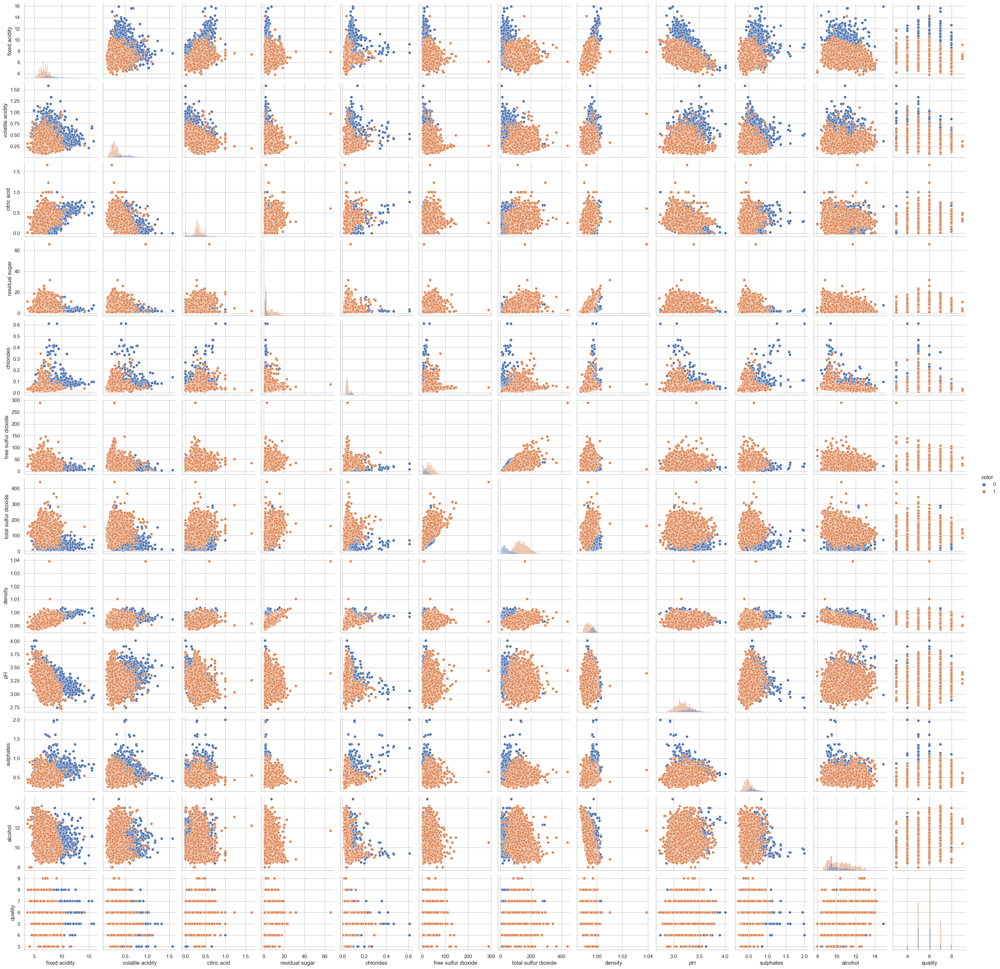

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(data, hue='color', diag_kind='hist')
plt.show()

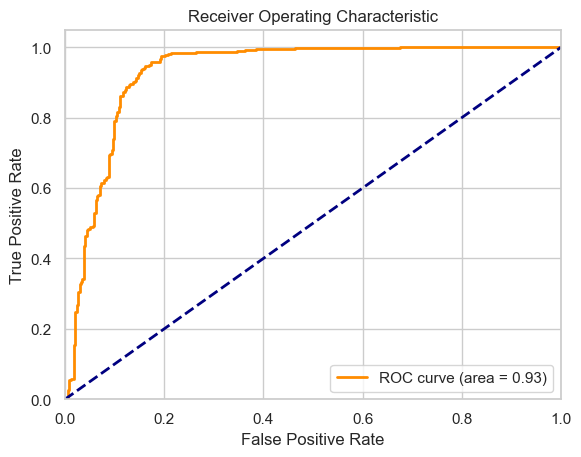

In [41]:
from sklearn.metrics import roc_curve, auc

probs = clf.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test, probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


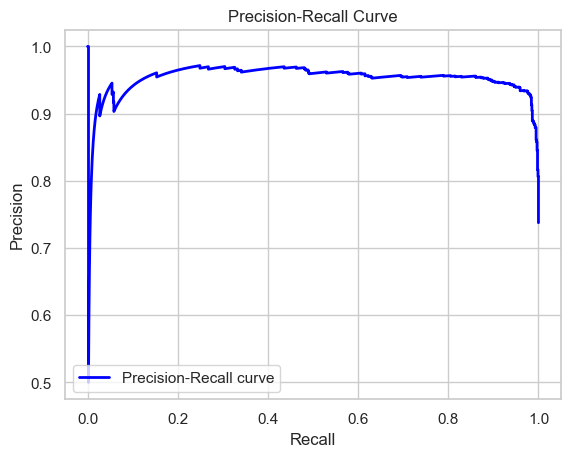

In [42]:
from sklearn.metrics import precision_recall_curve, average_precision_score

probs = clf.decision_function(X_test)
precision, recall, _ = precision_recall_curve(y_test, probs)

plt.figure()
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

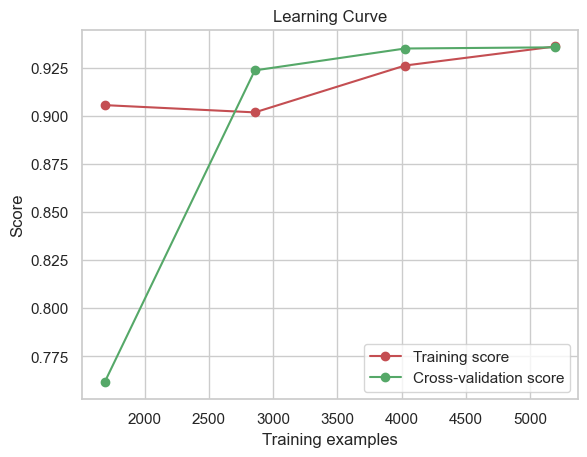

In [43]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(clf, X, y, cv=5)
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure()
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()


## Decision Tree Classifier 

Accuracy: 0.98


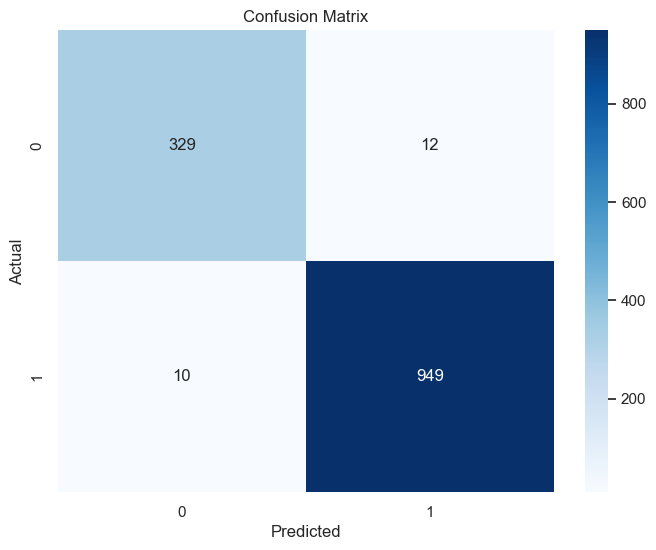

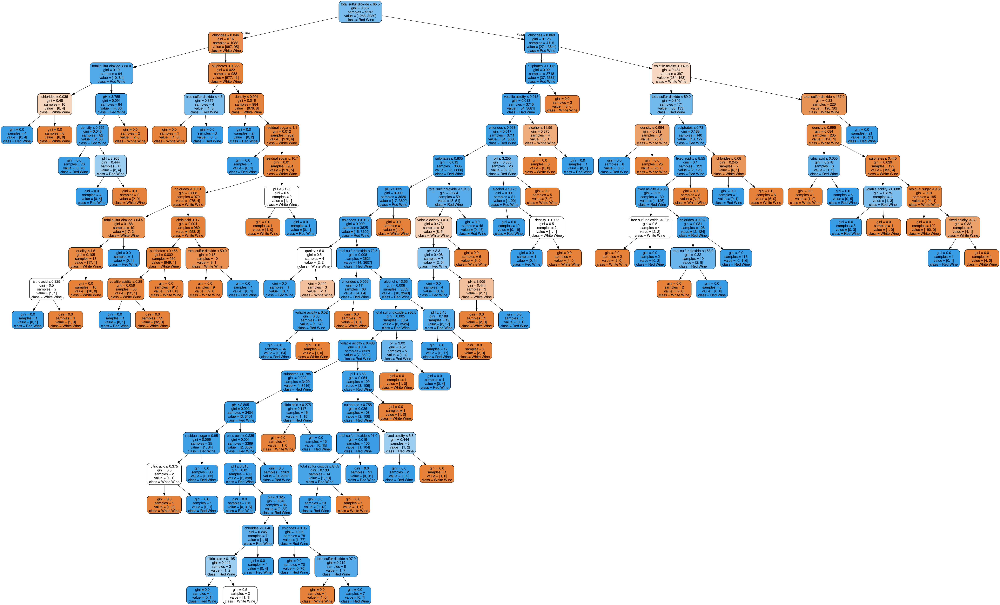

In [44]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
import graphviz

# Load the data into a Pandas DataFrame
data = pd.read_csv("wine_complete.csv")

# Separate features (X) and target (y)
X = data.drop(columns=['color'])
y = data['color']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Predict the color on the test data
y_pred = clf.predict(X_test)

# Calculate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Visualize the decision tree
dot_data = export_graphviz(clf, out_file=None,
                           feature_names=X.columns,
                           class_names=['White Wine', 'Red Wine'],
                           filled=True, rounded=True,
                           special_characters=True)
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render('decision_tree', view=True)

# Display the decision tree visualization
Image(filename='decision_tree.png')


## Random Forest Method

In [45]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Load the data into a Pandas DataFrame
datarfm = pd.read_csv("wine_complete.csv")

# Separate features and target variable
X = datarfm.drop(columns=['color'])
y = datarfm['color']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_classifier.fit(X_train, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.9946153846153846


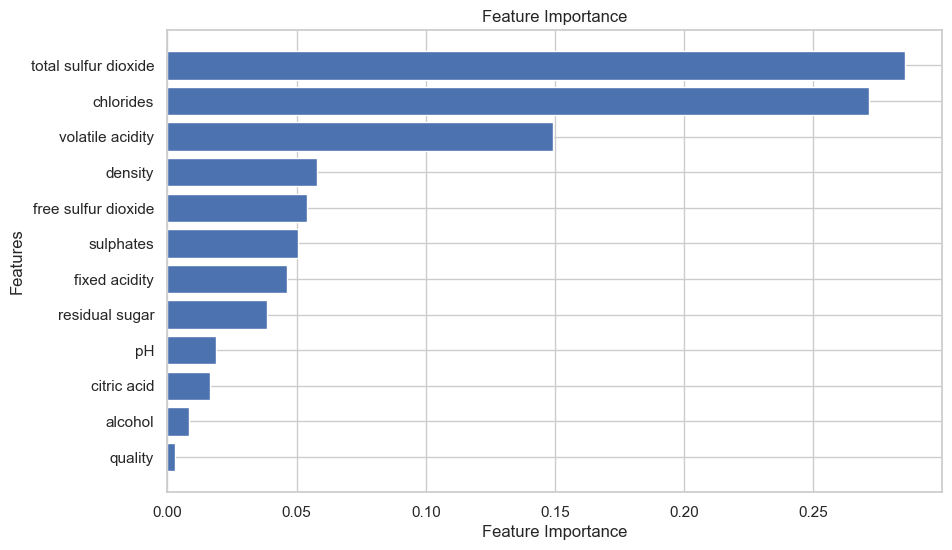

In [46]:
# Feature Importance
feature_importance = rf_classifier.feature_importances_
feature_names = X.columns
sorted_idx = feature_importance.argsort()

plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance')
plt.show()

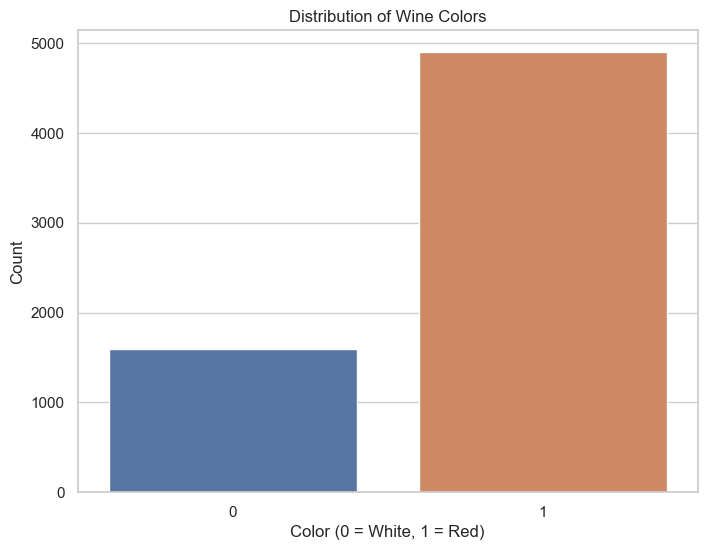

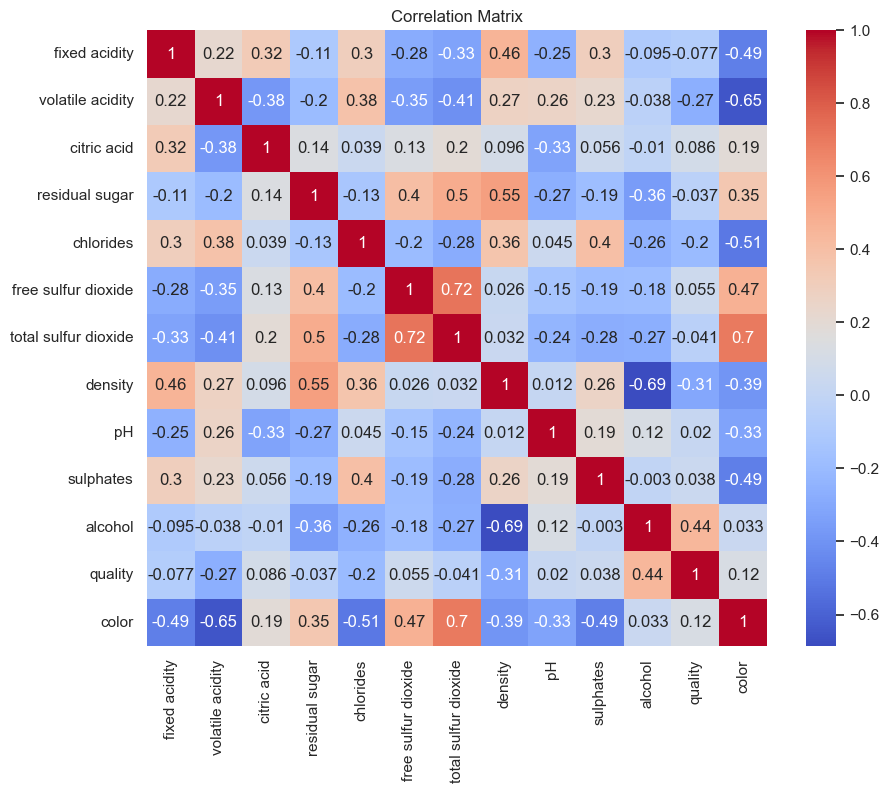

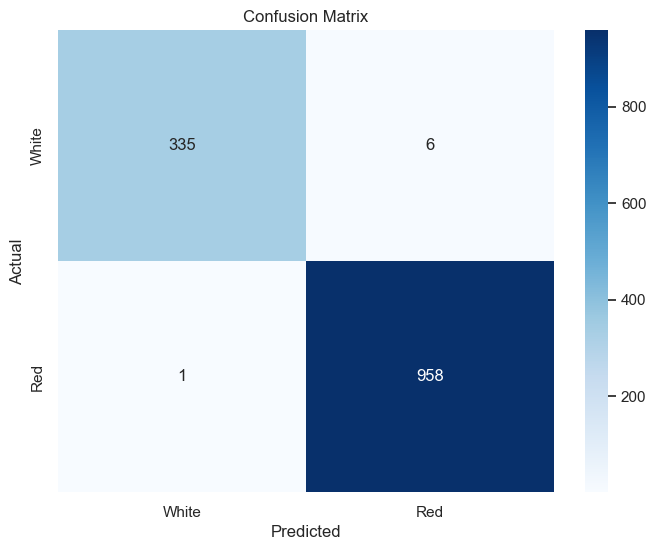

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

# Load the data into a Pandas DataFrame
data = pd.read_csv("wine_complete.csv")

# ... (Same data preparation as before)

# Visualize the distribution of wine colors
plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='color')
plt.title('Distribution of Wine Colors')
plt.xlabel('Color (0 = White, 1 = Red)')
plt.ylabel('Count')
plt.show()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# ... (Same model training and evaluation as before)

# Visualize the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.xticks([0.5, 1.5], ['White', 'Red'])
plt.yticks([0.5, 1.5], ['White', 'Red'])
plt.show()
